It seems that coefficients decrease in a sterotyped fashion - understanding how is important to apply that to image compression but also to understand generative models for images.

In [1]:
from __future__ import division, print_function
import matplotlib
#matplotlib.rcParams.update({'font.size': 18, 'font.family': 'STIXGeneral', 'mathtext.fontset': 'stix'})
matplotlib.rcParams.update({'font.size': 18, 'text.usetex': True})
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt

import numpy as np
np.set_printoptions(precision=2, suppress=True)

# fits decreases in RMSE

In [1]:

#import __init__
import numpy as np
from NeuroTools.parameters import ParameterSet
from SLIP import Image
from LogGabor import LogGabor
from SparseEdges import SparseEdges, plot
import sys
pe = ParameterSet('default_param.py')

threshold = None # classical plots
threshold = .5 # plot sparseness obtained when reaching this threshold

def init_pe(pe, N_image=10, N=512):
    pe.seed = 123456
    pe.N_image = N_image
    #pe.N_X = N_X
    pe.N = N
    im = Image(pe)
    lg = LogGabor(im)
    mp = SparseEdges(lg)
    return mp

dofig = True
try:
    figpath = sys.argv[1]
except:
    dofig = False

FORMATS = ['pdf', 'eps']
#FORMATS = ['png']
import matplotlib
matplotlib.use('Agg') 
#matplotlib.rcParams.update({'font.size': 18, 'font.family': 'STIXGeneral', 'mathtext.fontset': 'stix'})
matplotlib.rcParams.update({'text.usetex': False})

import matplotlib.pyplot as plt
fig_width_pt = 318.67085 # Get this from LaTeX using \showthe\columnwidth
inches_per_pt = 1.0/72.27               # Convert pt to inches
fig_width = fig_width_pt*inches_per_pt  # width in inches


mps, experiments = [], []
v_B_sf = np.logspace(-.2, .2, 5, base=10, endpoint=True)*pe.B_sf
for B_sf in v_B_sf:
    pe = ParameterSet('default_param.py')
    pe.B_sf = B_sf
    mp = init_pe(pe)
    exp = 'efficiency_B_sf_' + str(B_sf).replace('.', '_')
    mp.process(exp)
    experiments.append(exp)
    mps.append(mp)

databases = ['serre07_distractors'] * len(experiments)
labels = ['%0.2f' % B_sf for B_sf in v_B_sf]



INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 wi

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 wi

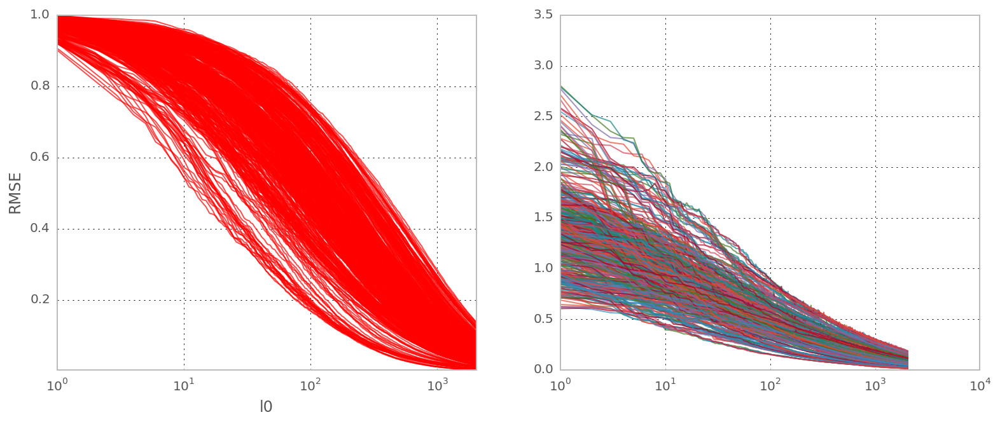

In [2]:
fig, [A, B] = plt.subplots(1, 2, figsize=(13, 5), subplot_kw={'axisbg':'w'})
A.set_color_cycle(np.array([[1., 0., 0.]]))
for mp, experiment, name_database, label in zip(mps, experiments, databases, labels):
    try:
        imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
        RMSE /= RMSE[:, 0][:, np.newaxis]
        #print RMSE.shape, edgeslist.shape
        value = edgeslist[4, ...]
        #value /= value[0, :][np.newaxis, :]
        value /= RMSE[:, 0][np.newaxis, :]
        
        B.semilogx( value, alpha=.7)
        
        A.semilogx( RMSE.T, alpha=.7)
        A.set_xlabel('l0')
        A.axis('tight')
        A.axis('tight')
        _ = A.set_ylabel('RMSE')
    except Exception, e:
        print('Failed to plot experiment %s with error : %s ' % (experiment, e) )



INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 wi

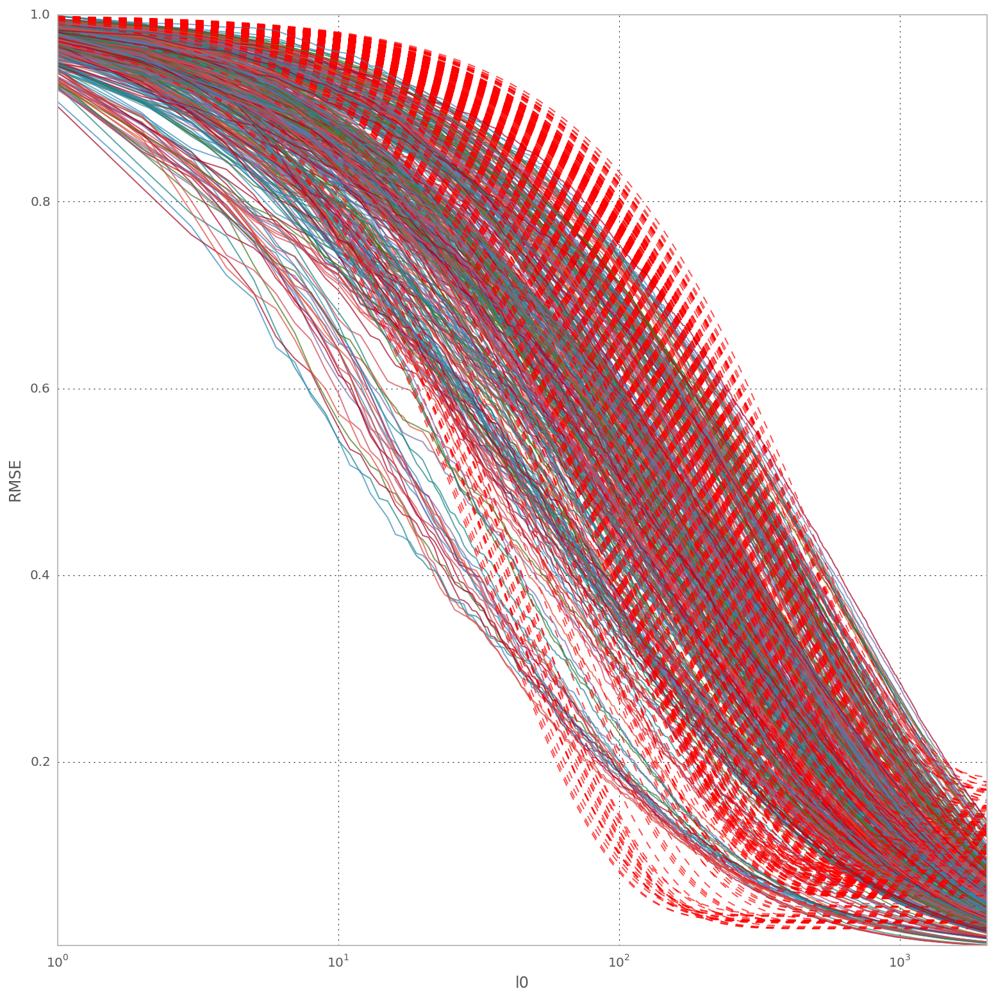

In [3]:
fig, A = plt.subplots(1, 1, figsize=(13, 13), subplot_kw={'axisbg':'w'})
from lmfit.models import ExpressionModel
#mod = PowerLawModel()
mod = ExpressionModel('1 - (1- eps_inf) * ( 1 - rho**x)')

threshold = .5

for mp, experiment, name_database, label in zip(mps, experiments, databases, labels):
    imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
    RMSE /= RMSE[:, 0][:, np.newaxis]
    N = RMSE.shape[1] #number of edges
    for i_image in range(RMSE.shape[0]):
        #pars = mod.guess(RMSE[i_image, :], x=np.arange(N))
        mod.def_vals = {'eps_inf':.1, 'rho':.99}
        out  = mod.fit(RMSE[i_image, :], x=np.arange(N))
        #print(out.fit_report(min_correl=0.25))
        eps_inf = out.params.get('eps_inf').value
        rho =  out.params.get('rho').value
        #print rho, eps_inf
        N_theta = np.log((threshold-eps_inf)/(1-eps_inf))/np.log(rho)
        #print N_theta
        A.semilogx( RMSE[i_image, :], alpha=.7)
        params = mod.make_params(eps_inf=eps_inf, rho=rho)
        A.semilogx(mod.eval(params, x=np.arange(N)), 'r--', alpha=.7)
        A.set_xlabel('l0')
        A.axis('tight')
        A.axis('tight')
        _ = A.set_ylabel('RMSE')            



In [ ]:
fig, A = plt.subplots(1, 1, figsize=(13, 13), subplot_kw={'axisbg':'w'})
from lmfit.models import ExpressionModel
#mod = PowerLawModel()
mod = ExpressionModel('rho**(1./(1.+(x/N50)**2)**.5)')

threshold = .5

for mp, experiment, name_database, label in zip(mps, experiments, databases, labels):
    imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
    RMSE /= RMSE[:, 0][:, np.newaxis]
    N = RMSE.shape[1] #number of edges
    for i_image in range(RMSE.shape[0]):
        #pars = mod.guess(RMSE[i_image, :], x=np.arange(N))
        mod.def_vals = {'N50':100., 'rho':.99}
        out  = mod.fit(RMSE[i_image, :], x=np.arange(N))
        #print(out.fit_report(min_correl=0.25))
        rho =  out.params.get('rho').value
        N50 =  out.params.get('N50').value
        print 'rho=', rho
        #N_theta = np.log(threshold)/np.log(rho)
        #print N_theta
        A.semilogx( RMSE[i_image, :], alpha=.7)
        params = mod.make_params(N50=N50, rho=rho)
        A.semilogx(mod.eval(params, x=np.arange(N)), 'r--', alpha=.7)
        A.set_xlabel('l0')
        A.axis('tight')
        A.axis('tight')
        _ = A.set_ylabel('RMSE')     
        



INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 


rho= 0.995770261405
rho= 0.996318573801
rho= 0.993959869162
rho= 0.998217210895
rho= 0.99747887092
rho= 0.983124315468
rho= 0.995982564986
rho= 0.996393923516
rho= 0.997491422815
rho= 0.991291267591
rho= 0.991230914893
rho= 0.996478200545
rho= 0.993203230813
rho= 0.998246155559
rho= 0.996360565616
rho= 0.995452622677
rho= 0.996887633939
rho= 0.997523292229
rho= 0.998013705662
rho= 0.989672411612
rho= 0.997316910331
rho= 0.99640679783
rho= 0.992554627907
rho= 0.996940592709
rho= 0.996324401549
rho= 0.998335718687
rho= 0.9971626371
rho= 0.996663945008
rho= 0.996953002956
rho= 0.995153743772
rho= 0.997668397535
rho= 0.99701732392
rho= 0.996454933976
rho= 0.997202397079
rho= 0.998213406319
rho= 0.979527779978
rho= 0.998100387403
rho= 0.997956371165
rho= 0.995632187792
rho= 0.996598742357
rho= 0.993660172022
rho= 0.993228928037
rho= 0.99314709721
rho= 0.981531896869
rho= 0.99511699186
rho= 0.994251640586
rho= 0.997010977542
rho= 0.997759893612
rho= 0.997768312207
rho= 0.996810227201
rho= 0.

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 


 0.996785305992
rho= 0.997419336014
rho= 0.998123834764
rho= 0.995492744815
rho= 0.996147345004
rho= 0.993370714748
rho= 0.998167048286
rho= 0.997319296048
rho= 0.981205587788
rho= 0.995741547737
rho= 0.996173846434
rho= 0.997352232408
rho= 0.990443255949
rho= 0.990574938937
rho= 0.996338843396
rho= 0.992670233934
rho= 0.998229786893
rho= 0.996159591313
rho= 0.995122645376
rho= 0.996689007398
rho= 0.997460709959
rho= 0.997945679898
rho= 0.989055265031
rho= 0.997167854847
rho= 0.996212539315
rho= 0.991950643895
rho= 0.996721654671
rho= 0.995998991296
rho= 0.998307369409
rho= 0.997063750124
rho= 0.996567536566
rho= 0.996864591475
rho= 0.994786464289
rho= 0.997573458183
rho= 0.996859797326
rho= 0.9962881294
rho= 0.997195972075
rho= 0.998163930073
rho= 0.9777755513
rho= 0.998047663468
rho= 0.997883628191
rho= 0.995336040806
rho= 0.996372829431
rho= 0.992923509899
rho= 0.992481063008
rho= 0.992654847961
rho= 0.979074748865
rho= 0.994748334473
rho= 0.993973016286
rho= 0.996880822862
rho= 0.9

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 


 0.996694777696
rho= 0.997307441278
rho= 0.998058369826
rho= 0.995424592533
rho= 0.99608473983
rho= 0.99319017755
rho= 0.998184550635
rho= 0.997260785781
rho= 0.980043796591
rho= 0.995628477787
rho= 0.996143532274
rho= 0.997364608335
rho= 0.98983282496
rho= 0.989866641606
rho= 0.996319997612
rho= 0.99221311743
rho= 0.998249006462
rho= 0.996057498134
rho= 0.99502719442
rho= 0.996629671485
rho= 0.997507724805
rho= 0.997935725769
rho= 0.988413308425
rho= 0.997129850645
rho= 0.996216981816
rho= 0.991702839235
rho= 0.996610189477
rho= 0.995929122082
rho= 0.998300919379
rho= 0.997020508236
rho= 0.996564668618
rho= 0.996917772586
rho= 0.994542344
rho= 0.997571962291
rho= 0.996782591485
rho= 0.99620740632
rho= 0.997317958259
rho= 0.998152644642
rho= 0.977679954185
rho= 0.99807206659
rho= 0.997871164923
rho= 0.995299383947
rho= 0.996361265313
rho= 0.992904502687
rho= 0.992298987501
rho= 0.992451048343
rho= 0.977471758947
rho= 0.994522027499
rho= 0.993743914704
rho= 0.996823173761
rho= 0.9978854

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 


 0.998057895181
rho= 0.995509948983
rho= 0.99611948775
rho= 0.993401665454
rho= 0.99826929306
rho= 0.997293065858
rho= 0.980093174267
rho= 0.995739845662
rho= 0.996338440673
rho= 0.997463261912
rho= 0.98978420779
rho= 0.989885880744
rho= 0.996352724072
rho= 0.992390845819
rho= 0.998289166841
rho= 0.996168828231
rho= 0.995132503766
rho= 0.996724871349
rho= 0.997609688293
rho= 0.997984496333
rho= 0.987891348201
rho= 0.997220891366
rho= 0.996444910003
rho= 0.991845785359
rho= 0.996621708438
rho= 0.996057800663
rho= 0.998336296951
rho= 0.997118161053
rho= 0.996766912461
rho= 0.997033372386
rho= 0.99461650405
rho= 0.997659032092
rho= 0.996880009665
rho= 0.99626774918
rho= 0.997525097341
rho= 0.998192409808
rho= 0.978772848465
rho= 0.998160921679
rho= 0.997914697104
rho= 0.995422849167
rho= 0.996408979634
rho= 0.993304853453
rho= 0.992462579439
rho= 0.99253370534
rho= 0.97686892769
rho= 0.994481874095
rho= 0.993837505483
rho= 0.996881264702
rho= 0.998003347504
rho= 0.997564683852
rho= 0.9964

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_633957276984 RMSE = 0.054257 


 0.998101557521
rho= 0.9957239427
rho= 0.996368608538
rho= 0.993928818903
rho= 0.998378283454
rho= 0.997411008863
rho= 0.980696006397
rho= 0.995997342792
rho= 0.996496261174
rho= 0.997634957873
rho= 0.990392005976
rho= 0.990145062268
rho= 0.996461739638
rho= 0.992739171287
rho= 0.998360767152
rho= 0.99641472102
rho= 0.995391956034
rho= 0.996903450349
rho= 0.997725088296
rho= 0.99809420486
rho= 0.988667467401
rho= 0.997381462945
rho= 0.996633292336
rho= 0.992168573616
rho= 0.996723292732
rho= 0.996342379712
rho= 0.998399569177
rho= 0.997258081968
rho= 0.996999725012
rho= 0.997194469279
rho= 0.994927975342
rho= 0.997789223402
rho= 0.996989454507
rho= 0.99642395779
rho= 0.997762419361
rho= 0.998257682353
rho= 0.979743931244
rho= 0.998291300858
rho= 0.998024859226
rho= 0.995700848703
rho= 0.996595951924
rho= 0.993793380892
rho= 0.992819688414
rho= 0.992878359453
rho= 0.978419516994
rho= 0.994615275504
rho= 0.994050366558
rho= 0.997007125779
rho= 0.998133973494
rho= 0.997681079535
rho= 0.99

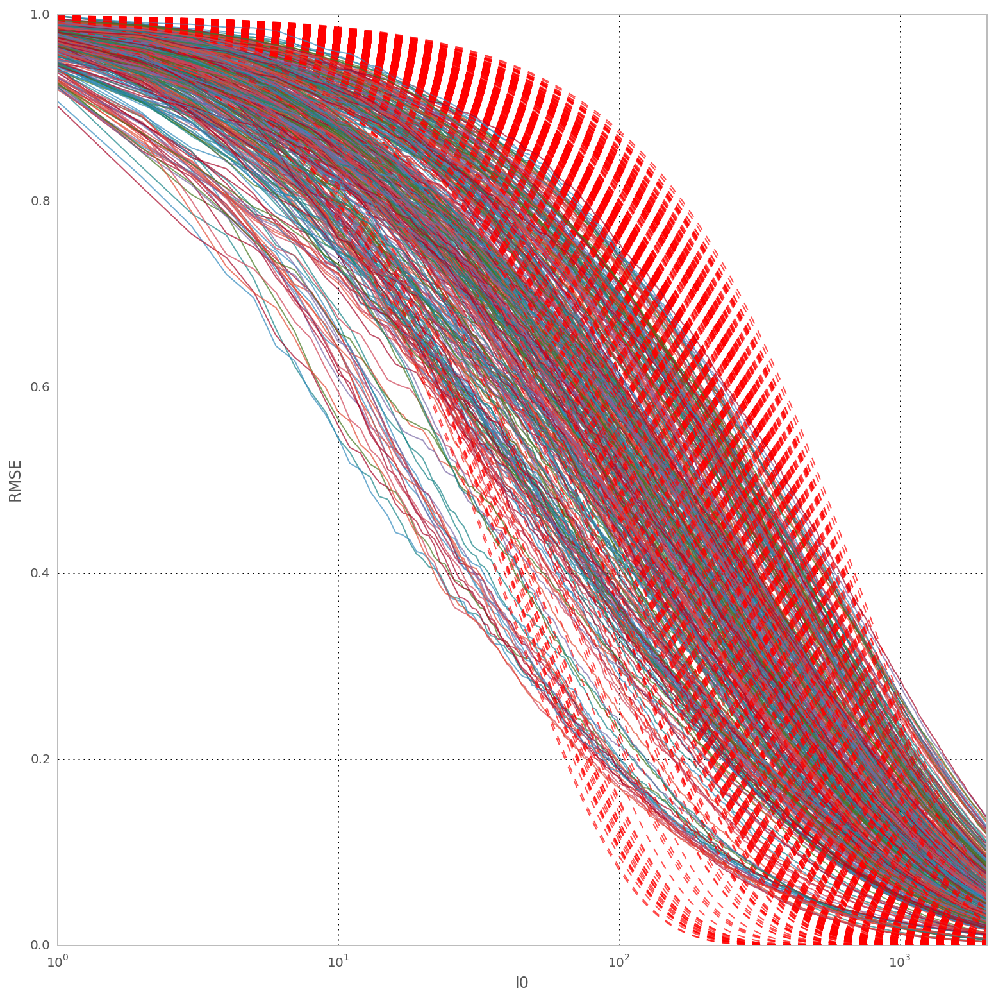

In [7]:
fig, A = plt.subplots(1, 1, figsize=(13, 13), subplot_kw={'axisbg':'w'})
from lmfit.models import ExpressionModel
#mod = PowerLawModel()
mod = ExpressionModel('rho**x')

threshold = .5

for mp, experiment, name_database, label in zip(mps, experiments, databases, labels):
    imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
    RMSE /= RMSE[:, 0][:, np.newaxis]
    N = RMSE.shape[1] #number of edges
    for i_image in range(RMSE.shape[0]):
        #pars = mod.guess(RMSE[i_image, :], x=np.arange(N))
        mod.def_vals = {'rho':.99}
        out  = mod.fit(RMSE[i_image, :], x=np.arange(N))
        #print(out.fit_report(min_correl=0.25))
        rho =  out.params.get('rho').value
        print 'rho=', rho
        #N_theta = np.log(threshold)/np.log(rho)
        #print N_theta
        A.semilogx( RMSE[i_image, :], alpha=.7)
        params = mod.make_params(rho=rho)
        A.semilogx(mod.eval(params, x=np.arange(N)), 'r--', alpha=.7)
        A.set_xlabel('l0')
        A.axis('tight')
        A.axis('tight')
        _ = A.set_ylabel('RMSE')            



In [5]:
fig, A = plt.subplots(1, 1, figsize=(13, 13), subplot_kw={'axisbg':'w'})

imagelist_ref, edgeslist_ref, RMSE_ref = mps[2].process(exp=experiments[2], name_database=name_database)
RMSE_ref /= RMSE_ref[:, 0][:, np.newaxis]

colors = [plt.cm.hsv(hsv) for hsv in np.linspace(0., 1., len(mps))]
for mp, experiment, name_database, label, color in zip(mps, experiments, databases, labels, colors):
    imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
    RMSE /= RMSE[:, 0][:, np.newaxis]
    N = RMSE.shape[1] #number of edges
    for i_image in range(RMSE.shape[0]):
        A.semilogx( RMSE[i_image, :]/RMSE_ref[i_image, :], alpha=.1, color=color)
        A.set_xlabel('l0')
        A.axis('tight')
        A.axis('tight')
        _ = A.set_ylabel('RMSE')            
    print (RMSE/RMSE_ref).mean(), (RMSE/RMSE_ref).std(axis=0).mean(), (RMSE/RMSE_ref).std(axis=0).shape


INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 


1.05962243518 0.0440129609743 (2048,)
1.01106289301

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 


 0.0215257807277 (2048,)
1.0

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 


 0.0 (2048,)
1.02762260879

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_633957276984 RMSE = 0.054257 


 0.0183460224792 (2048,)


KeyboardInterrupt: 

KeyboardInterrupt: 

In [41]:
mod = ExpressionModel('rho**x')

threshold = .5

def fit_rho(mp, experiment, name_database):
    imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
    RMSE /= RMSE[:, 0][:, np.newaxis]
    N = RMSE.shape[1] #number of edges
    rho = np.zeros(RMSE.shape[0])
    for i_image in range(RMSE.shape[0]):
        mod.def_vals = {'rho':.99}
        out  = mod.fit(RMSE[i_image, :], x=np.arange(N))
        rho[i_image] =  out.params.get('rho').value
    return rho

rho = fit_rho(mps[2], experiment, name_database=name_database)
L0_ref = np.log(threshold)/np.log(rho)
print L0_ref
for mp, experiment, name_database in zip(mps, experiments, databases):
    rho = fit_rho(mp, experiment, name_database=name_database)
    L0 = np.log(threshold)/np.log(rho)
    print L0
    print (L0/L0_ref).mean(), (L0/L0_ref).std(), L0.shape


INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_633957276984 RMSE = 0.054257 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 


[ 161.75  190.53  113.82  427.07  267.38   35.56  172.82  197.48  292.73
   71.8    69.99  195.55   95.12  422.5   192.98  150.07  223.5   304.35
  363.36   60.82  264.36  205.54   88.16  211.19  189.16  432.75  252.45
  230.68  246.72  136.31  313.18  229.89  193.48  309.43  397.48   33.87
  405.31  350.59  160.88  203.28  111.33   96.19   96.98   31.77  128.38
  116.16  231.25  371.11  298.56  203.79   93.25  411.42  218.27  413.44
  373.83  218.06  140.01  192.21  478.16  141.45  178.43  467.29  132.
  510.52  241.02  168.46  320.99  176.78  217.54  274.98  237.26   82.53
  208.45  287.4    46.05  286.94  357.95  163.46  521.98  308.03  153.9
  299.36   27.66  103.14  285.32  212.14   99.7   110.06  143.08  383.05
  116.16  297.75  298.33  376.81  247.12  265.8   159.2   217.91  269.81
  378.84]
[ 163.53  187.94  114.41  388.45  274.59   40.73  172.19  191.87  275.96
   79.25   78.7   196.47  101.63  394.87  190.11  152.08  222.36  279.52
  348.62   66.77  257.99  192.56   92.75  22

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 



0.998935655667 0.0826584004604 (100,)
[ 153.44  179.57  104.21  377.81  258.22   36.53  162.42  180.81  261.44
   72.18   73.2   188.98   94.22  391.21  180.14  141.77  209.    272.62
  337.06   62.98  244.4   182.66   85.77  211.09  172.9   409.16  235.72
  201.59  220.72  132.6   285.31  220.39  186.39  246.85  377.17   30.84
  354.69  327.17  148.27  190.75   97.6    91.84   94.02   32.78  131.64
  114.66  221.87  313.56  290.92  203.05   93.95  374.55  213.16  374.35
  358.68  213.94  126.6   178.45  440.72  140.87  161.62  425.08  125.39
  476.34  221.25  149.61  291.16  164.11  206.22  261.62  224.54   90.32
  192.19  254.57   50.59  258.77  286.57  163.27  470.78  297.62  149.7
  286.05   33.57  102.89  269.93  209.5    98.31  111.08  125.06  357.37
  105.14  288.52  287.47  345.12  201.65  244.49  152.57  209.37  257.08
  356.65]

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 



0.945628230483 0.057933012316 (100,)
[ 151.15  176.69  101.44  381.46  252.7    34.39  158.21  179.39  262.67
   67.83   68.06  188.01   88.67  395.51  175.47  139.04  205.31  277.77
  335.44   59.48  241.16  182.88   83.19  204.13  169.92  407.61  232.29
  201.42  224.54  126.66  285.13  215.09  182.42  258.09  374.86   30.71
  359.18  325.25  147.11  190.14   97.34   89.66   91.47   30.42  126.19
  110.45  217.84  327.46  279.06  194.82   89.43  376.8   206.12  375.26
  352.79  204.64  129.57  178.95  441.67  134.44  160.11  426.59  122.01
  483.39  221.05  149.45  293.31  163.13  202.46  253.13  222.56   84.7
  193.28  254.32   47.01  259.16  298.67  156.17  478.17  292.91  141.14
  279.33   30.99   97.63  266.42  203.04   93.75  106.56  126.14  351.59
  104.79  281.17  283.12  345.24  208.22  243.19  149.71  208.91  253.81
  356.56]

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 



0.929079699356 0.0365006139492 (100,)
[ 154.03  178.28  104.7   400.15  255.72   34.47  162.36  188.96  272.9
   67.5    68.19  189.7    90.75  404.81  180.58  142.06  211.29  289.64
  343.56   56.9   249.07  194.63   84.66  204.83  175.48  416.28  240.18
  214.04  233.3   128.41  295.75  221.82  185.37  279.72  383.12   32.31
  376.55  332.05  151.09  192.68  103.18   91.61   92.49   29.62  125.27
  112.13  221.91  346.81  284.28  196.31   89.03  390.25  208.94  391.3
  356.67  206.94  134.31  182.25  452.35  134.55  165.7   444.46  125.89
  491.71  229.66  156.07  302.01  168.18  206.47  258.44  224.73   82.08
  199.44  267.07   45.08  268.81  324.73  157.12  494.04  297.24  144.05
  284.08   28.05   99.13  271.36  203.88   96.19  108.53  135.32  357.5
  109.03  285.87  285.2   357.27  225.11  251.54  153.79  211.91  259.43
  364.77]

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_633957276984 RMSE = 0.054257 



0.950200910496 0.0166231958365 (100,)
[ 161.75  190.53  113.82  427.07  267.38   35.56  172.82  197.48  292.73
   71.8    69.99  195.55   95.12  422.5   192.98  150.07  223.5   304.35
  363.36   60.82  264.36  205.54   88.16  211.19  189.16  432.75  252.45
  230.68  246.72  136.31  313.18  229.89  193.48  309.43  397.48   33.87
  405.31  350.59  160.88  203.28  111.33   96.19   96.98   31.77  128.38
  116.16  231.25  371.11  298.56  203.79   93.25  411.42  218.27  413.44
  373.83  218.06  140.01  192.21  478.16  141.45  178.43  467.29  132.
  510.52  241.02  168.46  320.99  176.78  217.54  274.98  237.26   82.53
  208.45  287.4    46.05  286.94  357.95  163.46  521.98  308.03  153.9
  299.36   27.66  103.14  285.32  212.14   99.7   110.06  143.08  383.05
  116.16  297.75  298.33  376.81  247.12  265.8   159.2   217.91  269.81
  378.84]
1.0 0.0 (100,)


In [44]:

threshold = .5

def fit_L0(mp, experiment, name_database, threshold=threshold):
    imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
    RMSE /= RMSE[:, 0][:, np.newaxis]
    N = RMSE.shape[1] #number of edges
    L0 =  np.argmax(RMSE<threshold, axis=1)*1.
    return L0

L0_ref = fit_L0(mps[2], experiment, name_database=name_database)
print L0_ref
for mp, experiment, name_database in zip(mps, experiments, databases):
    L0 = fit_rho(mp, experiment, name_database, threshold)
    print L0
    print (L0/L0_ref).mean(), (L0/L0_ref).std(), L0.shape


INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_633957276984 RMSE = 0.054257 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 


[  74.  103.   61.  306.  162.   19.   84.  106.  171.   29.   38.  124.
   39.  324.   90.   82.  133.  171.  244.   36.  156.  107.   49.  121.
  101.  299.  163.  149.  162.   68.  176.  129.  123.  207.  268.   19.
  285.  228.   95.  112.   55.   53.   46.   14.   72.   62.  141.  282.
  177.  118.   51.  288.  109.  281.  251.  128.   81.  111.  319.   81.
   99.  335.   72.  378.  168.   94.  213.  109.  124.  175.  148.   43.
  122.  176.   27.  167.  259.   86.  391.  166.   85.  194.   15.   45.
  195.  106.   45.   45.   80.  260.   62.  202.  171.  267.  150.  163.
   90.  132.  151.  256.]
[  79.  103.   65.  262.  171.   22.   88.  100.  155.   37.   44.  127.
   45.  297.   87.   87.  131.  151.  230.   43.  154.   93.   52.  135.
  102.  285.  163.  132.  139.   75.  178.  134.  125.  151.  263.   18.
  244.  221.   93.  115.   52.   55.   48.   19.   83.   69.  145.  221.
  189.  125.   55.  262.  128.  263.  247.  147.   78.  110.  301.   93.
   93.  305.   69.  348. 

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 



1.01675535431 0.123740009395 (100,)
[  73.   99.   58.  254.  157.   20.   82.   97.  151.   30.   39.  123.
   42.  290.   82.   77.  126.  148.  221.   39.  143.   90.   47.  121.
   93.  277.  155.  127.  142.   70.  168.  124.  116.  155.  247.   17.
  236.  213.   87.  112.   46.   48.   45.   15.   77.   65.  141.  230.
  175.  117.   53.  256.  113.  256.  237.  134.   74.  107.  293.   84.
   88.  294.   66.  344.  150.   85.  189.  103.  116.  164.  139.   50.
  110.  147.   31.  152.  194.   92.  349.  163.   86.  189.   19.   49.
  180.  107.   42.   49.   73.  243.   58.  200.  169.  241.  120.  145.
   84.  126.  147.  238.]

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 



0.951086047185 0.0824527154099 (100,)
[  72.   97.   57.  267.  150.   19.   76.   97.  150.   28.   38.  122.
   39.  299.   82.   75.  123.  154.  220.   37.  137.   87.   47.  119.
   91.  277.  151.  127.  145.   64.  163.  119.  116.  164.  247.   17.
  239.  208.   92.  108.   45.   49.   43.   14.   75.   64.  136.  245.
  162.  113.   49.  259.  105.  256.  230.  129.   77.  108.  285.   76.
   86.  298.   64.  351.  153.   84.  189.  101.  117.  156.  137.   45.
  112.  149.   29.  154.  206.   88.  351.  161.   80.  183.   17.   45.
  179.   99.   42.   46.   70.  236.   56.  195.  162.  244.  126.  145.
   84.  131.  142.  235.]

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 



0.93128841735 0.0563672157359 (100,)
[  70.   97.   57.  281.  152.   19.   77.  101.  158.   27.   37.  121.
   38.  309.   86.   77.  128.  159.  229.   33.  145.   97.   48.  120.
   94.  282.  157.  138.  154.   65.  173.  125.  117.  183.  256.   18.
  258.  212.   91.  107.   51.   50.   43.   13.   72.   64.  135.  260.
  168.  114.   49.  272.  103.  265.  237.  124.   80.  107.  295.   74.
   90.  312.   68.  357.  162.   87.  198.  106.  120.  161.  140.   43.
  118.  160.   27.  159.  228.   86.  365.  157.   80.  186.   16.   44.
  186.  100.   44.   46.   77.  237.   57.  195.  160.  256.  136.  152.
   86.  129.  146.  243.]

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_633957276984 RMSE = 0.054257 



0.950209521765 0.0294523178698 (100,)
[  74.  103.   61.  306.  162.   19.   84.  106.  171.   29.   38.  124.
   39.  324.   90.   82.  133.  171.  244.   36.  156.  107.   49.  121.
  101.  299.  163.  149.  162.   68.  176.  129.  123.  207.  268.   19.
  285.  228.   95.  112.   55.   53.   46.   14.   72.   62.  141.  282.
  177.  118.   51.  288.  109.  281.  251.  128.   81.  111.  319.   81.
   99.  335.   72.  378.  168.   94.  213.  109.  124.  175.  148.   43.
  122.  176.   27.  167.  259.   86.  391.  166.   85.  194.   15.   45.
  195.  106.   45.   45.   80.  260.   62.  202.  171.  267.  150.  163.
   90.  132.  151.  256.]
1.0 0.0 (100,)


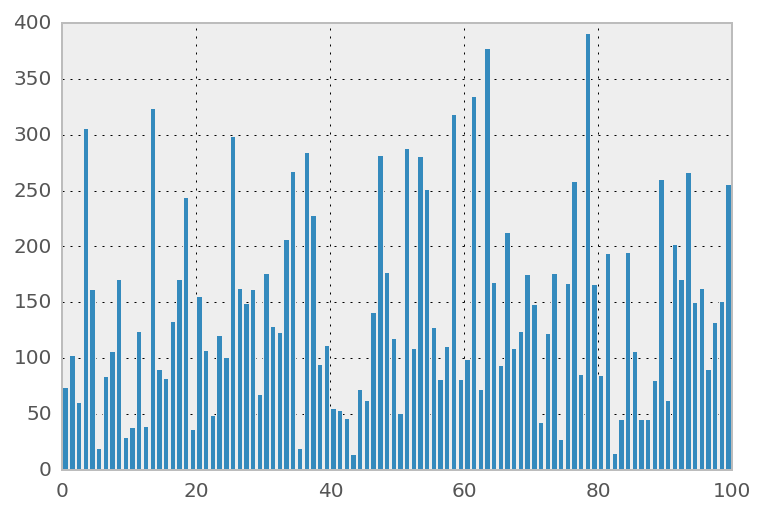

In [48]:
rect = plt.bar(np.arange(L0.shape[0]), L0)

In [52]:
r = rect[0]

In [53]:
r.set_color('w')
r.set_edgecolor('b')

In [2]:
try:
    fig, A, ax = plot(mps=mps,
                      experiments=experiments, databases=databases, labels=labels, 
                      fig=fig, ax=A, color=[0., 1., 0.], threshold=threshold, scale=True)    
    A.set_xlabel(r'frequency bandwith $B_{sf}$')
    A.set_yticks([0., 0.02, 0.04, 0.06])
except Exception, e:
    print('Failed to plot  with error : %s ' % e )
    

Failed to plot  with error : name 'fig' is not defined 


In [25]:
plt.cm.hsv(0.1)


(1.0, 0.5790446966917554, 0.0, 1.0)

## quantization

In [3]:
import matplotlib
#matplotlib.rcParams.update({'font.size': 18, 'font.family': 'STIXGeneral', 'mathtext.fontset': 'stix'})
matplotlib.rcParams.update({'font.size': 18, 'text.usetex': True})
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt

import numpy as np
np.set_printoptions(precision=2, suppress=True)

#import __init__
import numpy as np
from NeuroTools.parameters import ParameterSet
from SLIP import Image
from LogGabor import LogGabor
from SparseEdges import SparseEdges, plot
import sys
pe = ParameterSet('default_param.py')
pe.seed = 42 # this ensures that all image lists are the same for the different experiments
pe.N_image = 9
pe.N = 512
im = Image(pe)
lg = LogGabor(im)
mp = SparseEdges(lg)
name_database = 'serre07_distractors'
imageslist, edgeslist, RMSE = mp.process(exp='prior_vanilla', name_database=name_database)
imageslist, edgeslist, RMSE_prior =  mp.process(exp='prior_firstorder', name_database=name_database)

INFO:SparseEdges: > computing edges for experiment prior_vanilla with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment prior_vanilla RMSE = 0.246826 
INFO:SparseEdges: > computing edges for experiment prior_firstorder with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment prior_firstorder RMSE = 0.250297 


(9, 512)


(array([ 2.,  0.,  1.,  0.,  1.,  2.,  1.,  1.,  0.,  1.]),
 array([ 0.97,  0.97,  0.98,  0.98,  0.98,  0.98,  0.99,  0.99,  0.99,
         1.  ,  1.  ]),
 <a list of 10 Patch objects>)

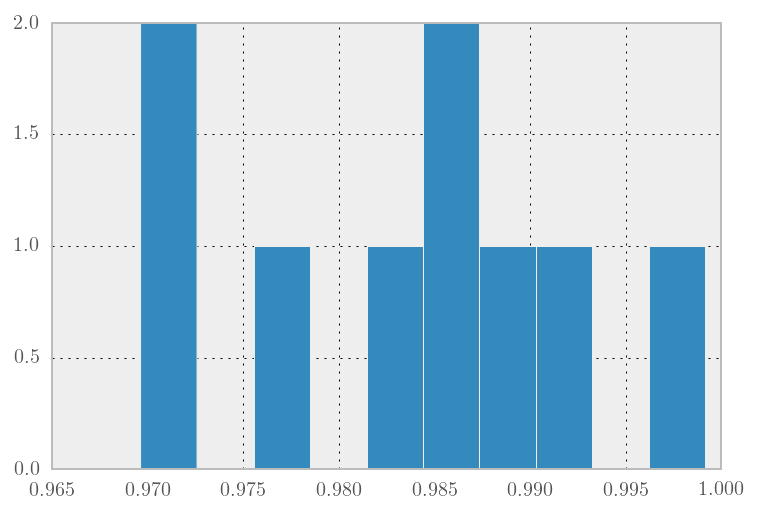

In [4]:
print RMSE.shape
plt.hist(RMSE[:, -1]/RMSE_prior[:, -1])

INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_252382937792 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_252382937792 RMSE = 0.050784 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_31773129389 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_31773129389 RMSE = 0.048454 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_4 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_4 RMSE = 0.048383 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_503570164718 with database serre07_distractors 
INFO:SparseEdges:>>> For the class serre07_distractors, in experiment efficiency_B_sf_0_503570164718 RMSE = 0.050446 
INFO:SparseEdges: > computing edges for experiment efficiency_B_sf_0_633957276984 wi

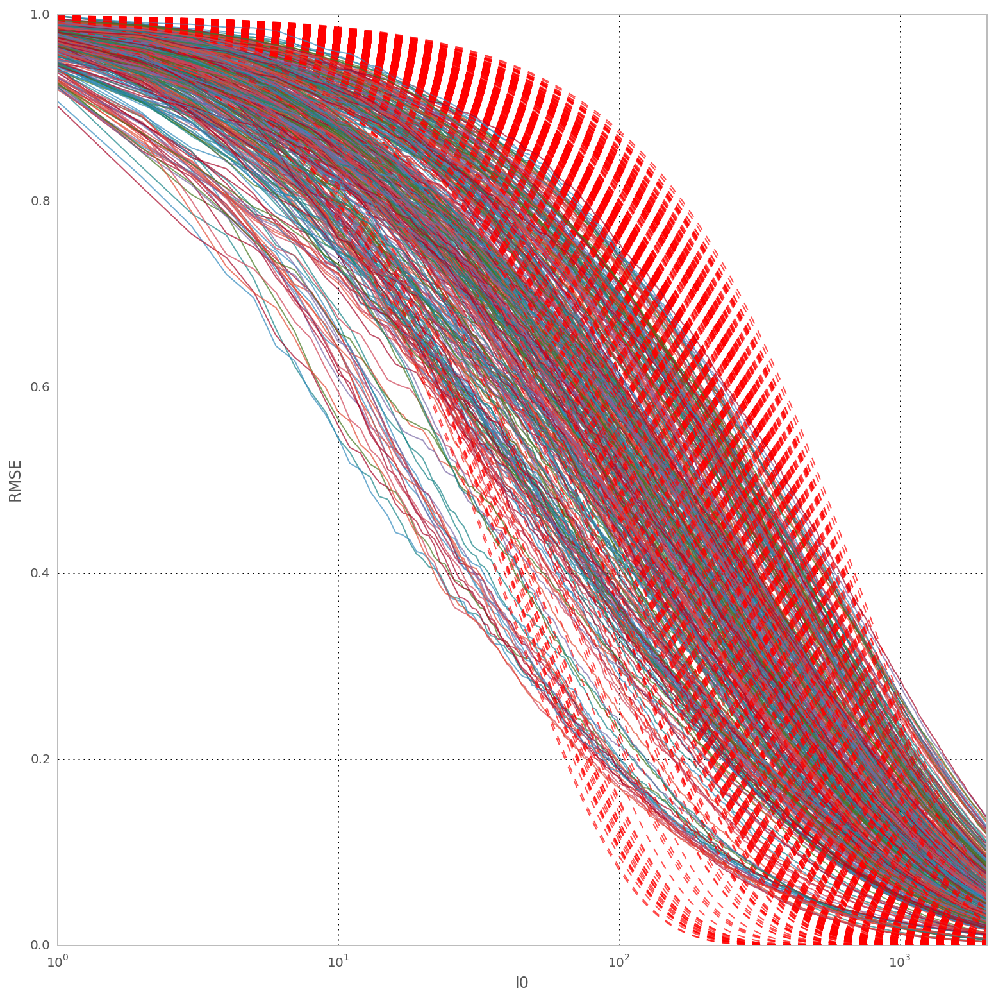

In [8]:
fig, A = plt.subplots(1, 1, figsize=(13, 13), subplot_kw={'axisbg':'w'})
from lmfit.models import ExpressionModel
#mod = PowerLawModel()
mod = ExpressionModel('rho**x')

threshold = .5

for mp, experiment, name_database, label in zip(mps, experiments, databases, labels):
    imagelist, edgeslist, RMSE = mp.process(exp=experiment, name_database=name_database)
    RMSE /= RMSE[:, 0][:, np.newaxis]
    N = RMSE.shape[1] #number of edges
    for i_image in range(RMSE.shape[0]):
        #pars = mod.guess(RMSE[i_image, :], x=np.arange(N))
        mod.def_vals = {'rho':.99}
        out  = mod.fit(RMSE[i_image, :], x=np.arange(N))
        #print(out.fit_report(min_correl=0.25))
        rho =  out.params.get('rho').value
        #print rho, eps_inf
        #N_theta = np.log(threshold)/np.log(rho)
        #print N_theta
        A.semilogx( RMSE[i_image, :], alpha=.7)
        params = mod.make_params(rho=rho)
        A.semilogx(mod.eval(params, x=np.arange(N)), 'r--', alpha=.7)
        A.set_xlabel('l0')
        A.axis('tight')
        A.axis('tight')
        _ = A.set_ylabel('RMSE')            

